In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.autograd import Variable
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from skimage import io, transform,data
from torchvision import transforms, utils
import numpy as np
import math
import glob
import matplotlib.pyplot as plt
import time
import os
import copy
import sklearn.svm
import cv2
from matplotlib import pyplot as plt
import numpy as np
from os.path import exists
import pandas as pd
import PIL
import random
from google.colab import drive
from sklearn.metrics.cluster import completeness_score
from sklearn.cluster import KMeans
from tqdm import tqdm, tqdm_notebook
from functools import partial
from torchsummary import summary
from torchvision.datasets import ImageFolder
from torch.utils.data.sampler import SubsetRandomSampler

#cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
#accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

#print("Accelerator type = ",accelerator)
#print("Pytorch verision: ", torch.__version__)

In [2]:
# This will prompt for authorization.
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
#!pip install tifffile

In [4]:
#!pip install imagecodecs


In [5]:
#files  = os.listdir('/content/drive/My Drive/AerialImageDataset/train/images')
#files.sort()

In [6]:
#print(len(files))

In [7]:
#print(files[1])

In [8]:
#import tifffile
#img  = tifffile.imread('/content/drive/My Drive/AerialImageDataset/train/images/' + files[1])


In [9]:
!pip install rasterio 


In [10]:
import rasterio as rio

In [11]:
tqdm = partial(tqdm, position=0, leave=True)

In [12]:
'''
src = '/content/drive/My Drive/AerialImageDataset/train/gt/'
target = '/content/drive/MyDrive/AerialImageDataset_rgb/train/gt/'
files  = os.listdir('/content/drive/My Drive/AerialImageDataset/train/gt')
files.sort()
#print(files[0])
for file in tqdm(files):
  if file.split('.')[1]=='tif':
    with rio.open(src + file) as img :
        imgnp= img.read()
    #img  = rio.imread(src + files[0])
    #profile['driver']='JPEG'
    jpeg_filename  = target + file.split('.')[0] + '.jpg'
    #jpeg_filename=tif_filename.with_suffix('.jpeg')
    with rio.open(jpeg_filename, 'w' ,width=5000,height=5000,count=1,dtype='uint8') as dst:
        dst.write(imgnp)
#print(imgnp.shape)
print(ok)
for file in tqdm(files):
  try:
    img  = tifffile.imread(src + file)
    print(img.shape)
    #img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    #img = img_bgr[::-1]

    #cv2.imwrite(target+file.split('.')[0]+'.jpg',img_bgr)
    print(ok)
  except:
    continue
'''

"\nsrc = '/content/drive/My Drive/AerialImageDataset/train/gt/'\ntarget = '/content/drive/MyDrive/AerialImageDataset_rgb/train/gt/'\nfiles  = os.listdir('/content/drive/My Drive/AerialImageDataset/train/gt')\nfiles.sort()\n#print(files[0])\nfor file in tqdm(files):\n  if file.split('.')[1]=='tif':\n    with rio.open(src + file) as img :\n        imgnp= img.read()\n    #img  = rio.imread(src + files[0])\n    #profile['driver']='JPEG'\n    jpeg_filename  = target + file.split('.')[0] + '.jpg'\n    #jpeg_filename=tif_filename.with_suffix('.jpeg')\n    with rio.open(jpeg_filename, 'w' ,width=5000,height=5000,count=1,dtype='uint8') as dst:\n        dst.write(imgnp)\n#print(imgnp.shape)\nprint(ok)\nfor file in tqdm(files):\n  try:\n    img  = tifffile.imread(src + file)\n    print(img.shape)\n    #img_bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)\n    #img = img_bgr[::-1]\n\n    #cv2.imwrite(target+file.split('.')[0]+'.jpg',img_bgr)\n    print(ok)\n  except:\n    continue\n"

In [13]:
train_path = '/content/drive/MyDrive/AerialImageDataset_rgb/train/images/' #Inria Aerial Image Dataset 
train_label = '/content/drive/MyDrive/AerialImageDataset_rgb/train/gt/'


In [14]:
import os
import torch
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from skimage import io, transform,data
from torchvision import transforms, utils
import numpy as np
import math
from matplotlib.patches import Ellipse
from skimage.draw import ellipse
import glob
import random
import torchvision.transforms.functional as TF

class AerialData(Dataset):
  def __init__(self, root_dir,train=True,test=False, transform=None,transform_test=None):
    self.root_dir = root_dir
    self.root_dir_train = root_dir + '/images/'
    self.labels_path = self.root_dir+'/gt/'
    self.train = train
    self.all_imgs_dir = os.listdir(self.root_dir_train)
    self.all_labels_dir = os.listdir(self.labels_path)
    self.transform = transform


  def __len__(self):
    if self.train==True:
      return len(self.all_imgs_dir)
  

  def transform_img_msk(self, image, mask,test=False):
      #preprocessor = transforms.Compose([transforms.ToTensor(),resize, transforms.RandomHorizontalFlip(),transforms.RandomVerticalFlip(),transforms.RandomRotation(45),transforms.RandomPerspective(), transforms.RandomAffine(degrees=20),normalize])
      normalize = transforms.Normalize(mean = [0.485,0.456,0.406],
                              std = [0.229,0.224,0.225])
      # Transform to tensor
      image = TF.to_tensor(image)
      mask = TF.to_tensor(mask)

      # Resize
      resize = transforms.Resize(size=(224, 224))
      image = resize(image)
      mask = resize(mask)

      if test==True:
        image = normalize(image)

        return image,mask
      '''


      # Random horizontal flipping
      if random.random() > 0.5:
          image = TF.rotate(image,45)
          mask = TF.rotate(mask,45)

      
      # Random horizontal flipping
      if random.random() > 0.5:
          image = TF.hflip(image)
          mask = TF.hflip(mask)

      # Random vertical flipping
      if random.random() > 0.5:
          image = TF.vflip(image)
          mask = TF.vflip(mask)

      '''
      #image = normalize(image)


      return image, mask




  def __getitem__(self,index):
    #index+=1
    if torch.is_tensor(index):
      index = index.tolist()
    #print(index)



    try:
      img_loc = os.path.join(self.root_dir_train, self.all_imgs_dir[index])
      img_name = img_loc.split('/')[-1]
      mask = os.path.join(self.labels_path, img_name)
    except FileNotFoundError:
      pass


    #print(img_name)
    #print(ok)
    image = io.imread(img_loc,as_gray=False)
    mask = io.imread(mask,as_gray=True)
    #print(image.shape)

    if self.transform:
      image,mask = self.transform_img_msk(image,mask)

    sample = {'image': image,'mask': mask,'name':img_name}

    #print(sample['label'])
    #plt.imshow(sample['image'])
    #plt.show()

    return sample

In [15]:
#Pre processing the data
normalize = transforms.Normalize(mean = [0.485,0.456,0.406],
                                std = [0.229,0.224,0.225])
resize = transforms.Resize((224,224))



preprocessor = transforms.Compose([ resize, transforms.ToTensor(), normalize
                                   ])

aerial_dataset_full = AerialData(root_dir='/content/drive/MyDrive/AerialImageDataset_rgb/train',transform=True)

# Creating data indices for training and validation splits:
dataset_size = len(aerial_dataset_full)
indices = list(range(dataset_size))
validation_split = 0.2
split = int(np.floor(validation_split * dataset_size))
shuffle_dataset = True
random_seed= 101

if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

aerial_train_loader = torch.utils.data.DataLoader(aerial_dataset_full, batch_size=2, 
                                           sampler=train_sampler)
aerial_validation_loader = torch.utils.data.DataLoader(aerial_dataset_full, batch_size=2,
                                                sampler=valid_sampler)

##**UNet-Model**

In [16]:
import torch
import torch.nn as nn
from torchvision import models

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [17]:
class UNet_main(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet_main, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)



    def forward(self, x):
        x1 = self.inc(x)

        x2 = self.down1(x1)

        x3 = self.down2(x2)

        x4 = self.down3(x3)

        x5 = self.down4(x4)

        x = self.up1(x5, x4)

        x = self.up2(x, x3)


        x = self.up3(x, x2)


        x = self.up4(x, x1)


        #print(x.shape)
        logits = self.outc(x)


        #print(logits.shape)
        #print(ok)
        return logits,[],[]

##**For Feature Extraction**
I just created a copy of the original UNet class because, if I had to run this model, which extracts the intermediate layers and outputs of each stage, this would casue memory error during training.


In [29]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

        self.layers = []
        self.all_out= []



    def forward(self, x):
        x1 = self.inc(x)
        self.all_out.append(x1)
        self.layers.append(self.inc)

        x2 = self.down1(x1)
        self.layers.append(self.down1)
        self.all_out.append(x2)

        x3 = self.down2(x2)
        self.all_out.append(x3)
        self.layers.append(self.down2)

        x4 = self.down3(x3)
        self.all_out.append(x4)
        self.layers.append(self.down3)


        x5 = self.down4(x4)
        self.all_out.append(x5)
        self.layers.append(self.down4)

        x = self.up1(x5, x4)
        self.all_out.append(x)
        self.layers.append(self.up1)

        x = self.up2(x, x3)
        self.all_out.append(x)
        self.layers.append(self.up2)

        x = self.up3(x, x2)
        self.all_out.append(x)
        self.layers.append(self.up3)

        x = self.up4(x, x1)
        self.all_out.append(x)
        self.layers.append(self.up4)

        #print(x.shape)
        logits = self.outc(x)
        self.all_out.append(logits)
        self.layers.append(self.outc)

        #print(logits.shape)
        #print(ok)
        return logits,self.all_out,self.layers

In [18]:
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU

In [19]:
from collections import defaultdict
import torch.nn.functional as F
import copy
from sklearn.metrics import jaccard_similarity_score


def dice_loss(pred, target, smooth = 1.):
    pred = pred.contiguous()
    target = target.contiguous()    

    intersection = (pred * target).sum(dim=2).sum(dim=2)
    
    loss = (1 - ((2. * intersection + smooth) / (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2) + smooth)))
    
    return loss.mean()

smooth = 1e-12
def jaccard_approx(pred, target, smooth=1e-12 ):
    #intersection = K.sum(y_true * y_pred, axis=[0, -1, -2])
    intersection = (pred * target).sum(dim=2).sum(dim=2)
    #sum_ = K.sum(y_true + y_pred, axis=[0, -1, -2])
    sum_ = (pred.sum(dim=2).sum(dim=2) + target.sum(dim=2).sum(dim=2))

    jac = (intersection + smooth) / (sum_ - intersection + smooth)

    return jac.mean()

def calc_loss(pred, target, metrics, bce_weight=0.5):
    bce = F.binary_cross_entropy_with_logits(pred, target)

    #pred = F.sigmoid(pred)

    #dice = dice_loss(pred, target)
    #loss = bce * bce_weight + dice * (1 - bce_weight)
    #loss = torch.log(jaccard_approx(pred,target))
    #loss = jaccard_approx(pred, target )
    loss = bce

    #iou_loss = IoULoss()
    #loss = iou_loss.forward(pred,target)




    #metrics['bce'] += bce.data.cpu().numpy() * target.size(0)
    #metrics['dice'] += dice.data.cpu().numpy() * target.size(0)
    metrics['loss'] += loss.data.cpu().numpy() * target.size(0)
    #metrics['iouloss'] += iouloss.data.cpu().numpy() * target.size(0)
    #metrics['jaccloss'] += jaccloss.data.cpu().numpy() * target.size(0)

    return loss

def calc_jacc_img_msk(model, prd, msk, batch_size, n_classes=1):
    #prd = model.predict(img, batch_size= batch_size)
    #print("prd.shape {0}, msk.shape {1}". format(prd.shape, msk.shape))
     #prd.shape, msk.shape (16, 2, 256, 256) (16, 2, 256, 256)
    avg, trs = [], []

    for i in range(n_classes):
        t_msk = msk[:, i, :, :] # t_mask shape is (Npredictions, H, W)
        t_prd = prd[:, i, :, :]
        t_msk = t_msk.reshape(msk.shape[0] * msk.shape[2], msk.shape[3]) # shape is Npredictions*W, H
        t_prd = t_prd.reshape(msk.shape[0] * msk.shape[2], msk.shape[3])

        m, b_tr = 0, 0
        for j in range(10):
            tr = j / 10
            pred_binary_mask = t_prd > tr

            jk = jaccard_similarity_score(t_msk, pred_binary_mask)
            if jk > m:
                m = jk
                b_tr = tr

        print("i, m, b_tr", i, m, b_tr)
        avg.append(m)
        trs.append(b_tr)

    score = sum(avg) / n_classes
    return score, trs

def print_metrics(metrics, epoch_samples, phase):
    outputs = []
    for k in metrics.keys():
        outputs.append("{}: {:4f}".format(k, metrics[k] / epoch_samples))

    print("{}: {}".format(phase, ", ".join(outputs)))


train_loss = []
test_loss = []

def train_model(model, optimizer, scheduler, num_epochs=10):
    #best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = 1e10

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        since = time.time()

      # Each epoch has a training and validation phase

        scheduler.step()
        for param_group in optimizer.param_groups:
            print("LR", param_group['lr'])
        print('Started training')

        model.train()  # Set model to training mode


        metrics = defaultdict(float)
        epoch_samples = 0

        for inputs in aerial_train_loader:
            #print(dataloaders['train'])
            #print('Entered')
            inputs['image'] = inputs['image'].to(device)
            inputs['mask'] =  inputs['mask'].to(device)

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward
            # track history if only in train

            outputs,_,_ = model(inputs['image'])
            loss = calc_loss(outputs, inputs['mask'], metrics)

            # backward + optimize only if in training phase
            loss.backward()
            optimizer.step()

            # statistics
            epoch_samples += inputs['image'].size(0)

        print_metrics(metrics, epoch_samples, 'train')
        epoch_loss = metrics['loss'] / epoch_samples
        train_loss.append(epoch_loss)

        #torch.save(model,f'/content/drive/My Drive/cars_latest/resunet50_epoch_{e}_1.pt')

        #train_score, trs = calc_jacc_img_msk(model, inputs['image'].cpu().numpy(), inputs['segmented_mask'].cpu().numpy(), 8, 1)


        #set model in evaluation mode
        model.eval()
        avg_loss = 0

        metrics = defaultdict(float)
        epoch_samples=0
        
        for inputs in aerial_validation_loader:

            #print(dataloaders['train'])
            inputs['image'] = inputs['image'].to(device)
            #print(inputs['image'].shape)
            inputs['mask'] =  inputs['mask'].to(device)
            

            outputs,_,_ = model(inputs['image'])
            loss = calc_loss(outputs, inputs['mask'], metrics)
            epoch_samples += inputs['image'].size(0)

        
        print_metrics(metrics, epoch_samples, 'val')
        epoch_loss = metrics['loss'] / epoch_samples
        test_loss.append(epoch_loss)

        #test_score, trs = calc_jacc_img_msk(model, outputs.cpu().data.numpy(), inputs['segmented_mask'].cpu().numpy(), 8, 1)

        #print("\n")
        print("Epoch: ", epoch, "Train Loss: ", train_loss[-1], "Test Loss: ", test_loss[-1] )

        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
        print("\n")
        if epoch%5==0:
          torch.save({
              'epoch': epoch,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optimizer.state_dict(),
              'train_loss': train_loss[-1],
              }, f'/content/drive/My Drive/AerialImageDataset_rgb/train/epoch_{epoch}_trainloss_{train_loss[-1]}_testloss_{test_loss[-1]}_unet_01.pt')

        torch.save({
              'epoch': epoch,
              'model_state_dict': model.state_dict(),
              'optimizer_state_dict': optimizer.state_dict(),
              'train_loss': train_loss[-1],
              }, f'/content/drive/My Drive/AerialImageDataset_rgb/train/epoch_{epoch}_trainloss_{train_loss[-1]}_testloss_{test_loss[-1]}_unet_01.pt')
        


    #print('Best val loss: {:4f}'.format(best_loss))

    # load best model weights
    #model.load_state_dict(best_model_wts)
    return model,train_loss,test_loss

In [55]:
model = UNet_main(n_channels=3, n_classes=1)

# setup SGD
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

gpu_flag = torch.cuda.is_available()
print(gpu_flag)
if gpu_flag:
    model = model.cuda()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


True


In [21]:
print(model)

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, moment

## **Summary of how an example image (224,224,3) is processed through the U-Net Model Pipeline**

In [48]:
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
        DoubleConv-7         [-1, 64, 224, 224]               0
         MaxPool2d-8         [-1, 64, 112, 112]               0
            Conv2d-9        [-1, 128, 112, 112]          73,856
      BatchNorm2d-10        [-1, 128, 112, 112]             256
             ReLU-11        [-1, 128, 112, 112]               0
           Conv2d-12        [-1, 128, 112, 112]         147,584
      BatchNorm2d-13        [-1, 128, 112, 112]             256
             ReLU-14        [-1, 128, 1

##**Feature-Extraction and Display of Feature Maps of Intermediate Layers for an example image tensor (Without Model-training)**

DoubleConv(
  (double_conv): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
)


<Figure size 1440x720 with 0 Axes>

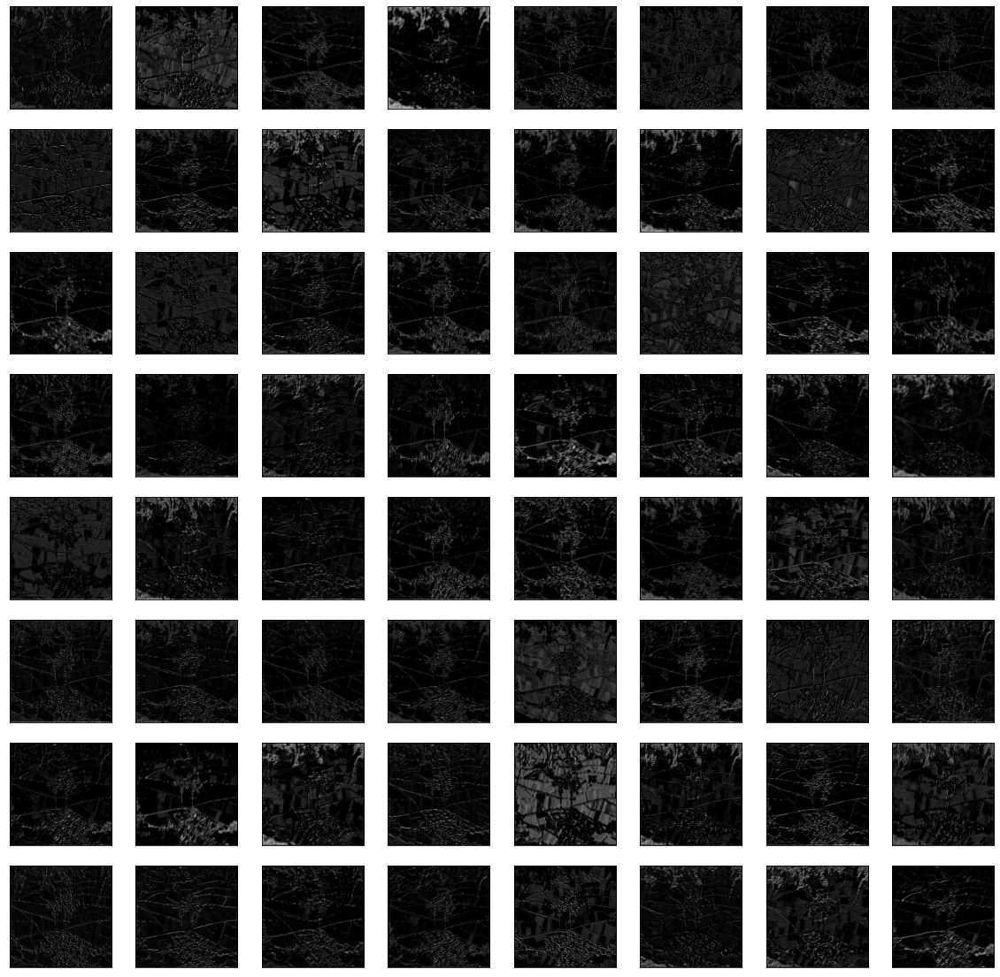

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

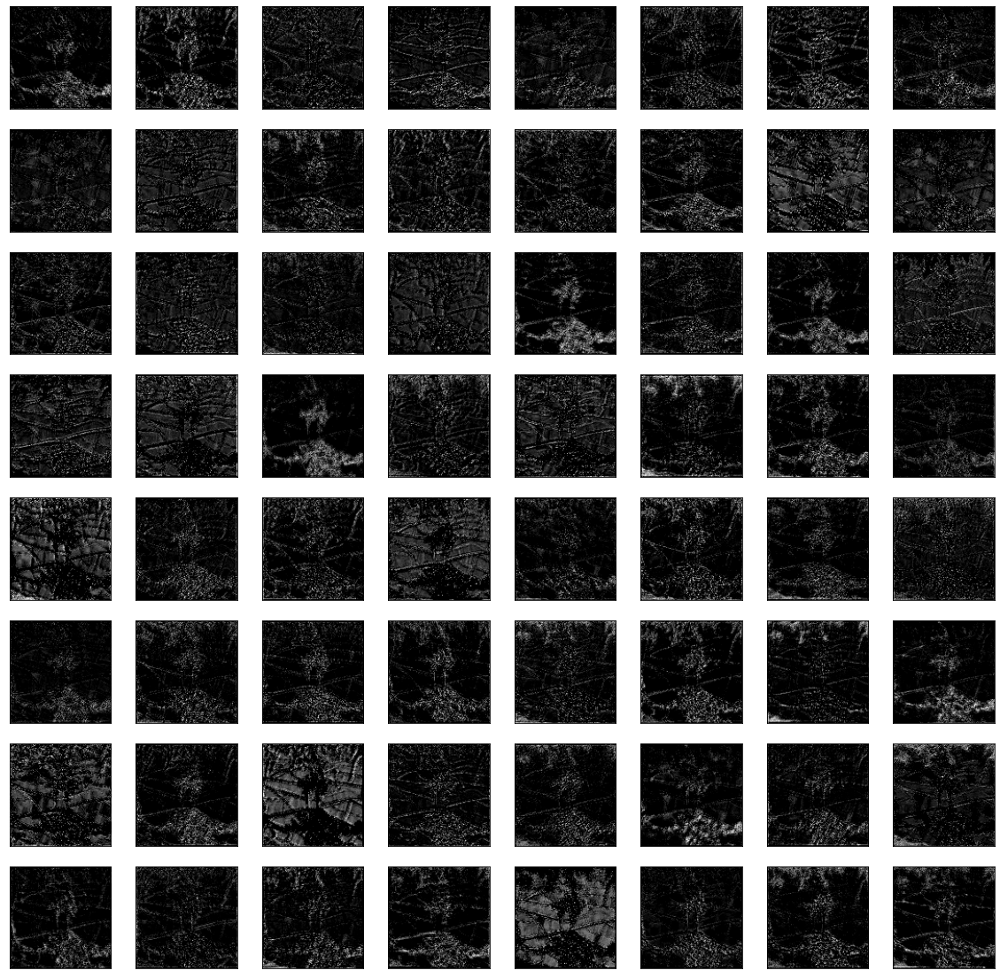

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

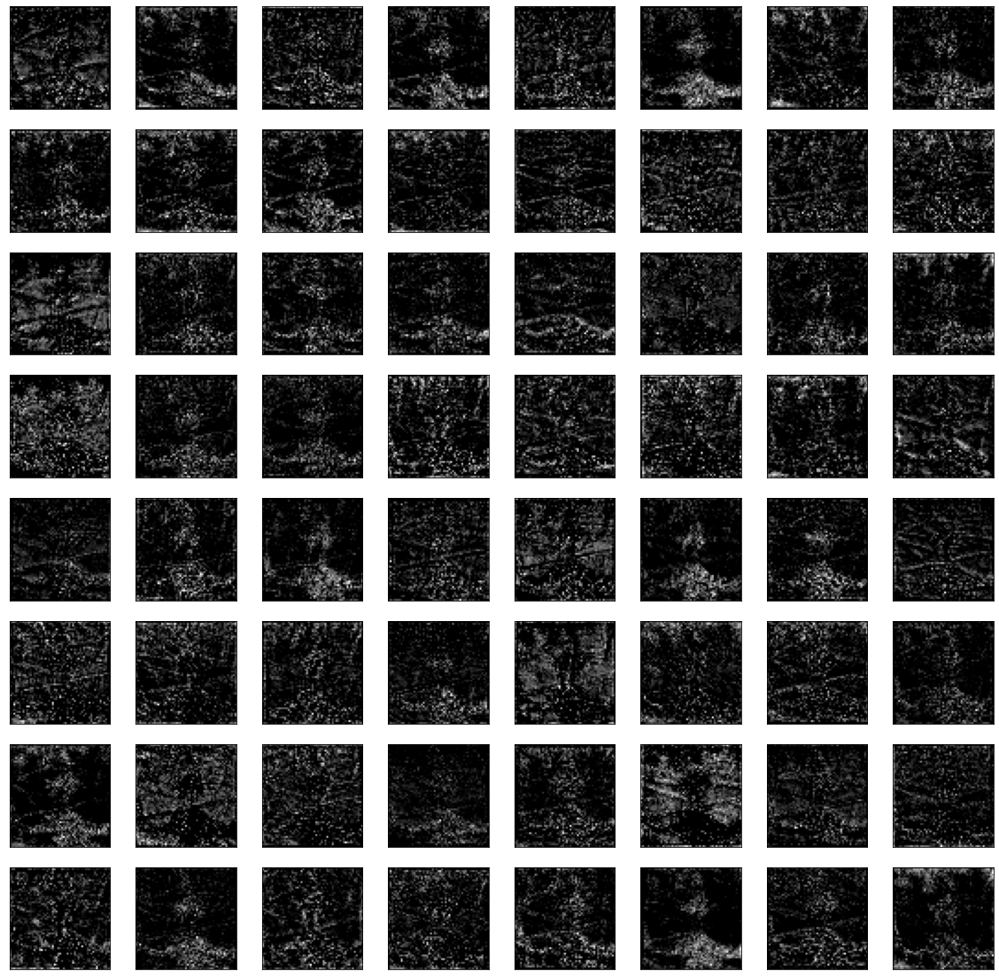

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

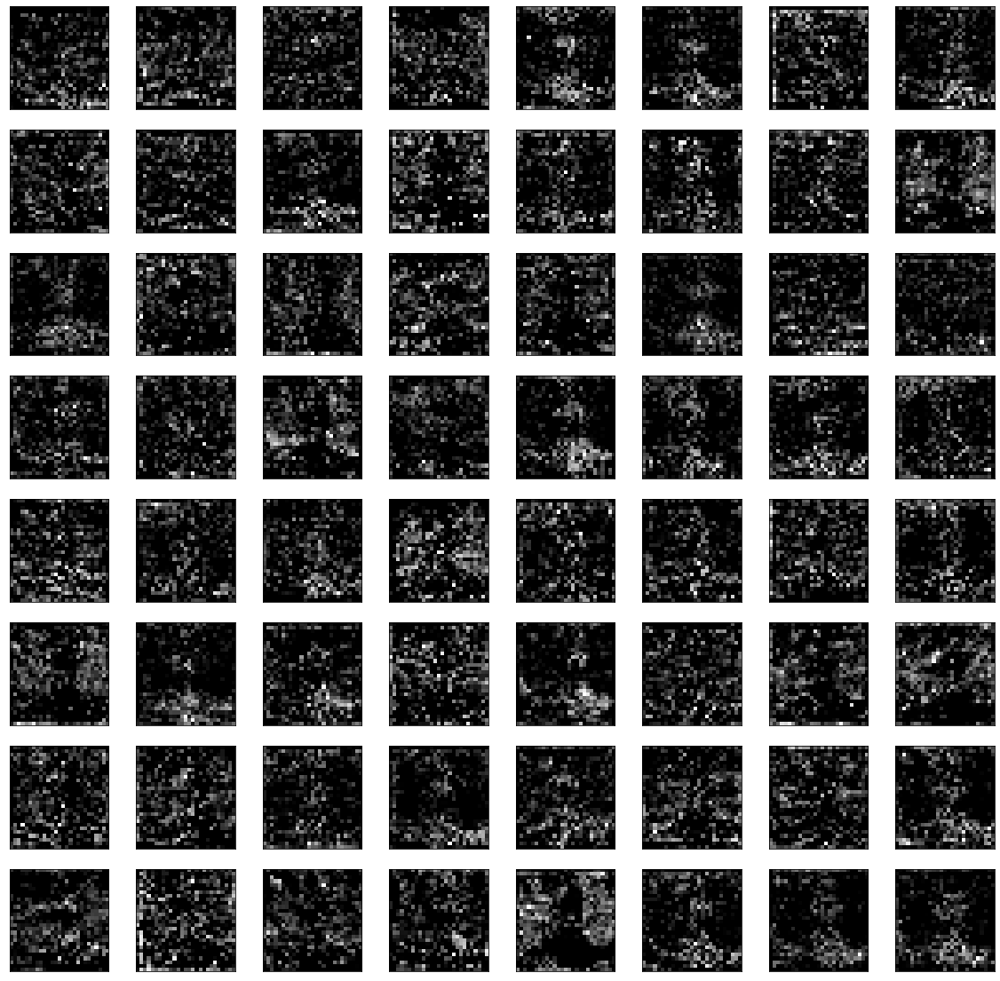

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

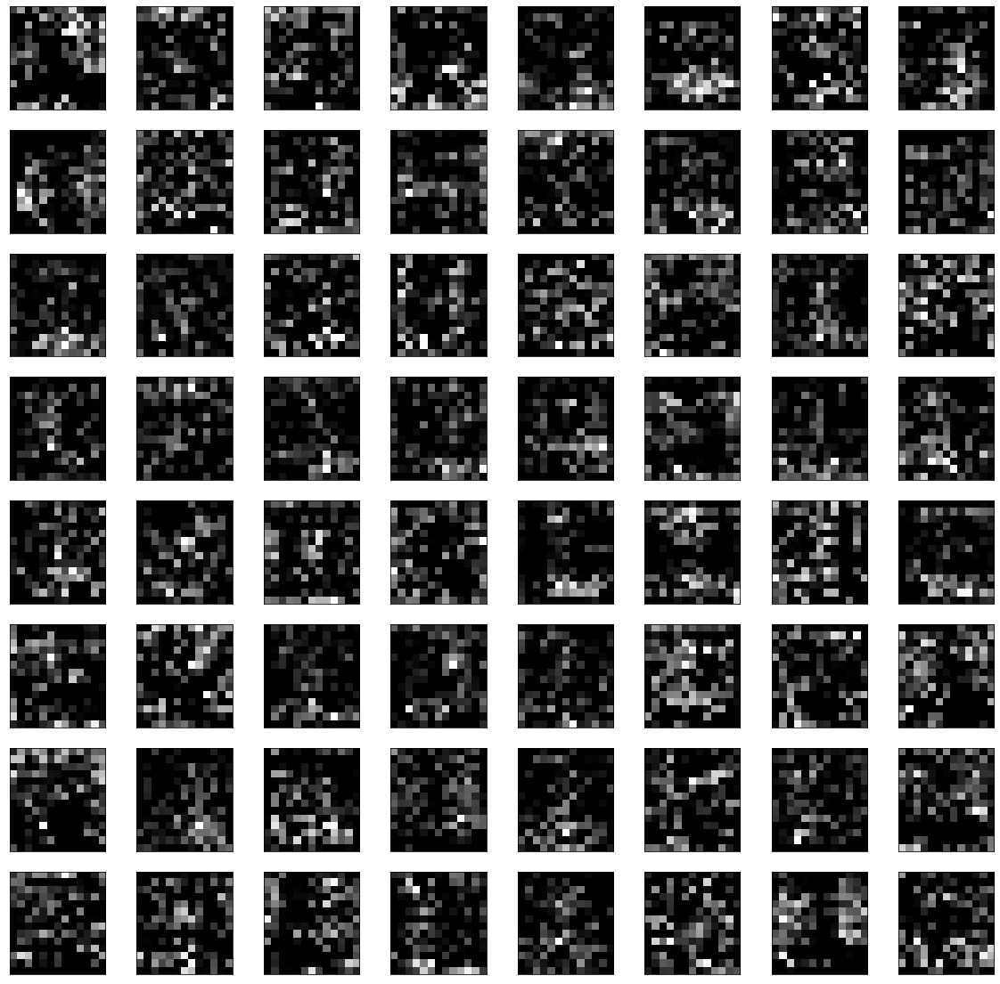

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

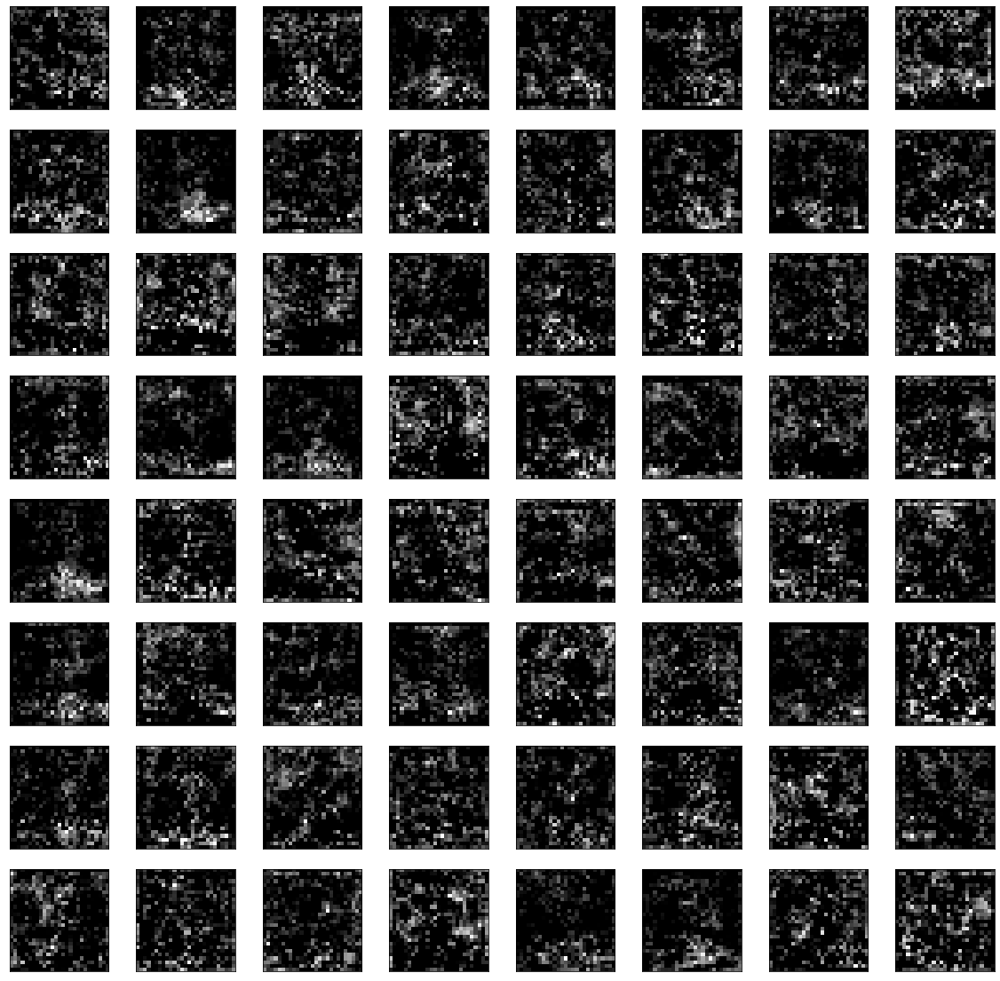

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

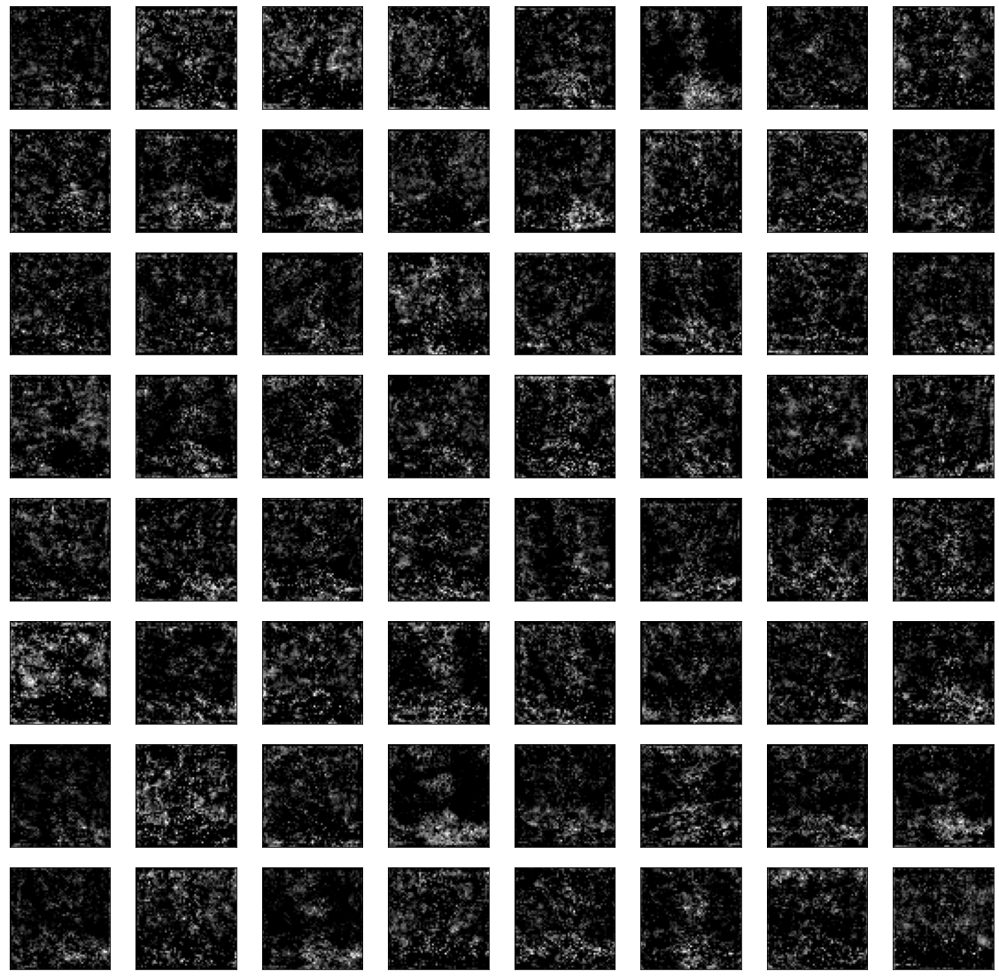

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

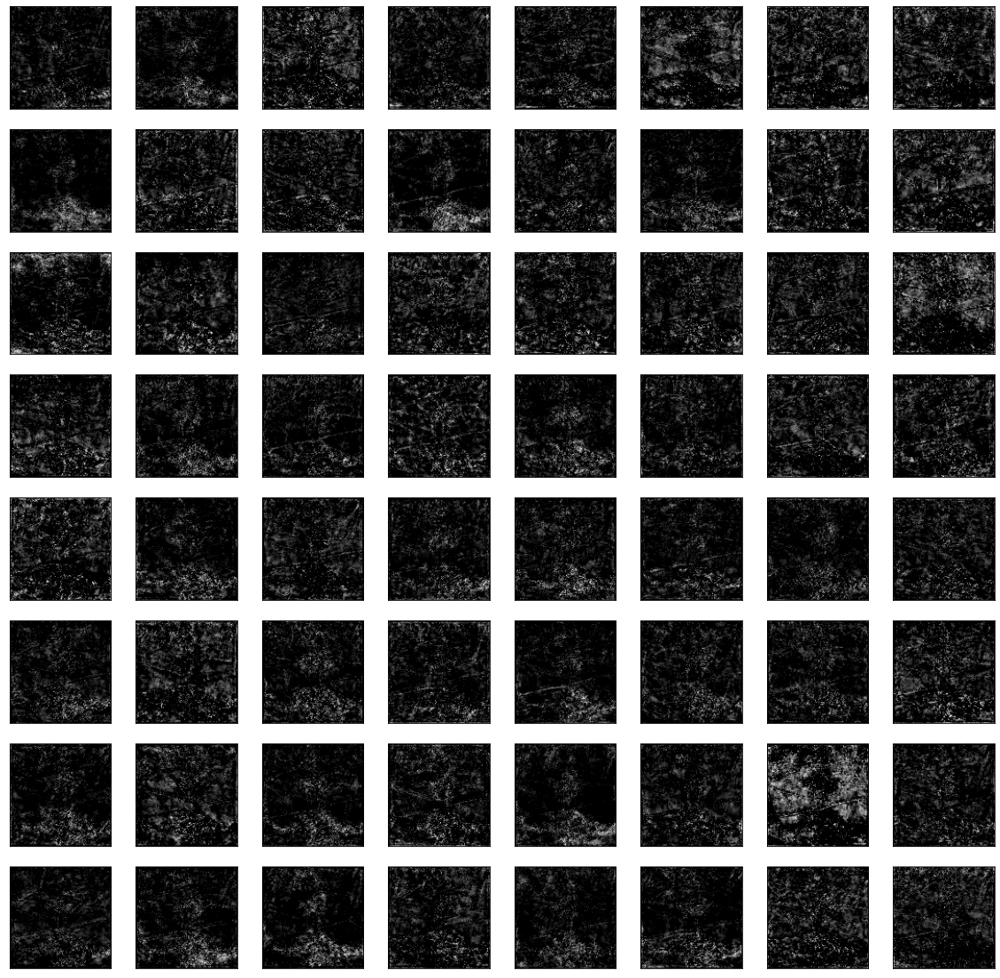

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

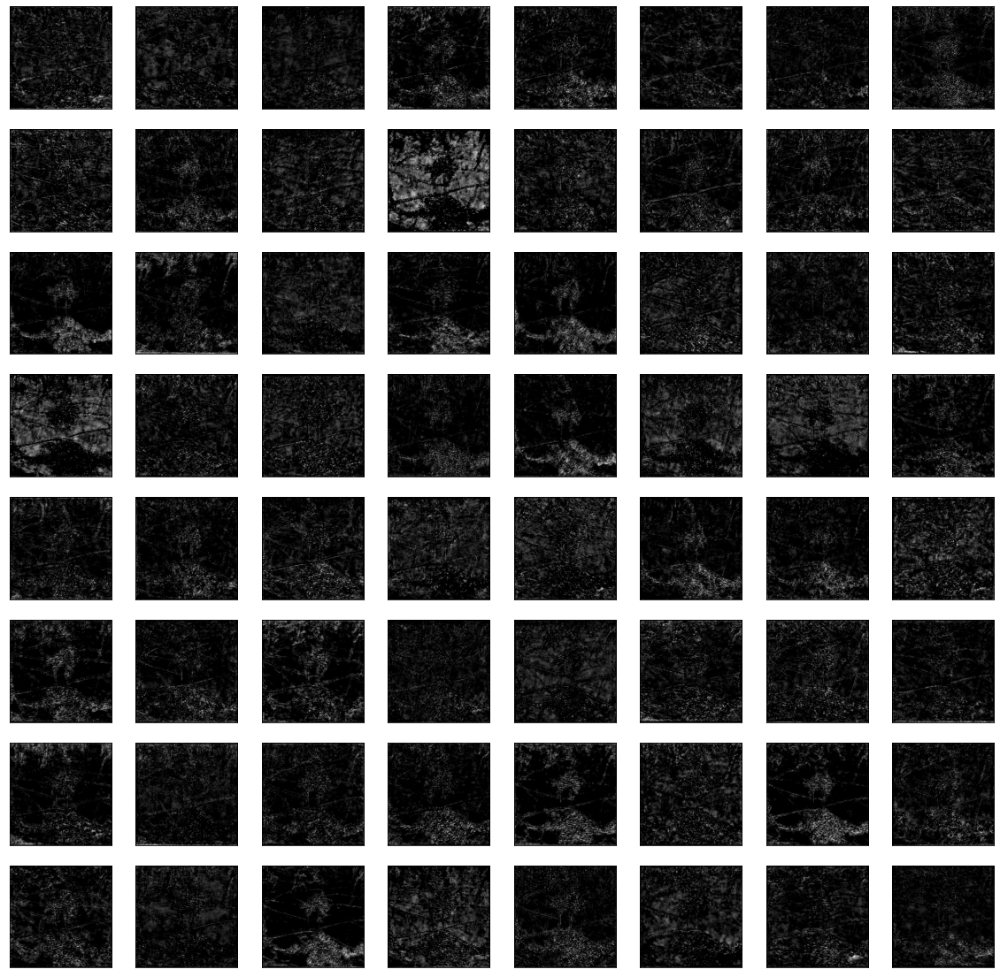

OutConv(
  (conv): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
)
(1, 224, 224)


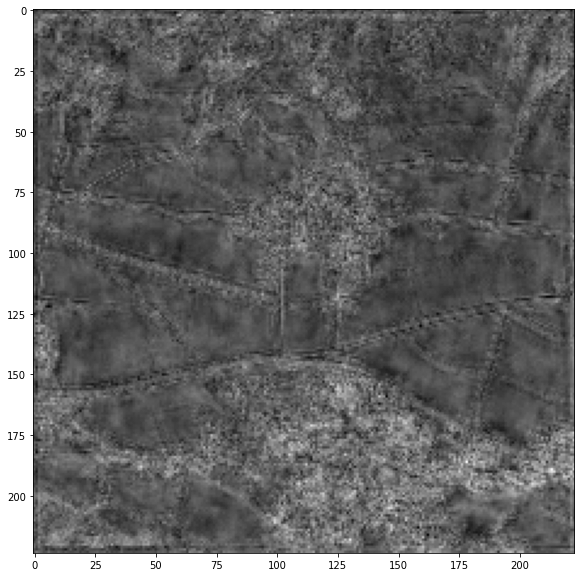

Feature Extraction done for first image (without any training)


In [58]:
#plt.figure(figsize = (20,10))


for i, sample in enumerate(aerial_validation_loader):
  img_var = Variable(sample['image'][1,:,:,:].unsqueeze(0)).cuda()

  out,img_feat_all,layers = model(img_var)


  for j,img_feat_batch in enumerate(img_feat_all):

    img_feat_1 = img_feat_batch[0,:,:,:]
    plt.figure(figsize = (20,10))


    img_numpy = img_feat_1.cpu().data.numpy()

    print(layers[j])
    
    if j>=9:
      print(img_numpy.shape)
      
      plt.imshow(img_numpy[0, :, :-1], cmap='gray')
      plt.show()
      print('Feature Extraction done for first image (without any training)')
    
      break

    # plot all 64 maps in an 8x8 squares
    square = 8
    square1 = int(8)
    ind = 1
    plt.figure(figsize = (20,20))
    for _ in range(square1):
      for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square1, square, ind)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(img_numpy[ind-1, :, :-1], cmap='gray')
        ind += 1
    # show the figure


    plt.show()
  break



# **U-Net Model Training and Validation**

In [21]:
model_trained,train_loss,test_loss = train_model(model, optimizer, exp_lr_scheduler, num_epochs=20)

Epoch 0/19
----------
LR 0.001
Started training


/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:134: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


train: loss: 0.418618
val: loss: 0.509129
Epoch:  0 Train Loss:  0.41861796006560326 Test Loss:  0.5091291492184004
3m 31s


Epoch 1/19
----------
LR 0.001
Started training
train: loss: 0.336834
val: loss: 0.369428
Epoch:  1 Train Loss:  0.3368339124653075 Test Loss:  0.369428426027298
2m 4s


Epoch 2/19
----------
LR 0.001
Started training
train: loss: 0.325826
val: loss: 0.328942
Epoch:  2 Train Loss:  0.3258264135155413 Test Loss:  0.3289418112900522
2m 4s


Epoch 3/19
----------
LR 0.001
Started training
train: loss: 0.310911
val: loss: 0.305409
Epoch:  3 Train Loss:  0.31091133194665116 Test Loss:  0.305409019605981
2m 4s


Epoch 4/19
----------
LR 0.001
Started training
train: loss: 0.303118
val: loss: 0.291869
Epoch:  4 Train Loss:  0.3031180656204621 Test Loss:  0.2918694524301423
2m 3s


Epoch 5/19
----------
LR 0.001
Started training
train: loss: 0.295602
val: loss: 0.283152
Epoch:  5 Train Loss:  0.29560218565165997 Test Loss:  0.2831515793999036
2m 3s


Epoch 6/19
---------

KeyboardInterrupt: ignored

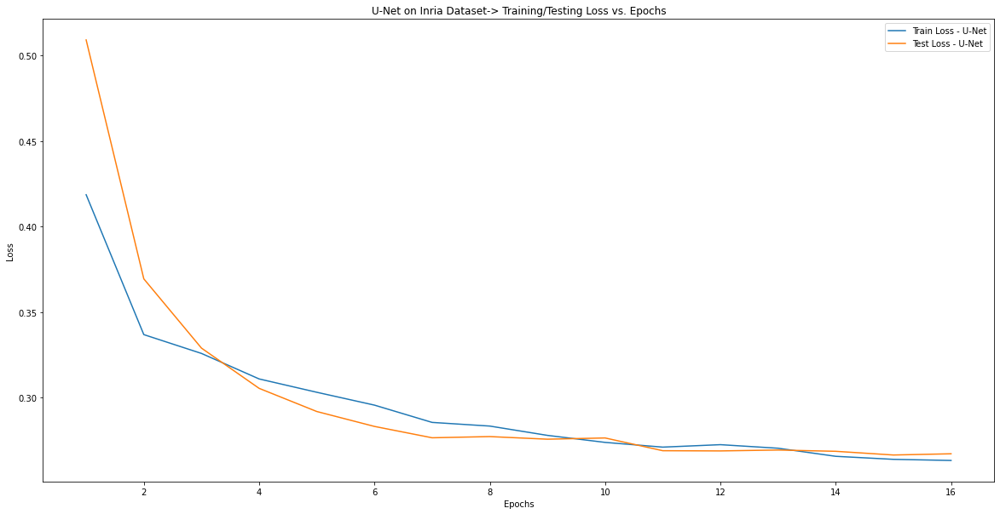

In [40]:
list_epochs = [i+1 for i in range(16)]

plt.figure(figsize = (20,10))


plt.plot(list_epochs,train_loss,label='Train Loss - U-Net')
plt.plot(list_epochs,test_loss,label='Test Loss - U-Net')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('U-Net on Inria Dataset-> Training/Testing Loss vs. Epochs')
plt.legend()


##**Result/Example**

(224, 224, 1)
(224, 224, 1)


NameError: ignored

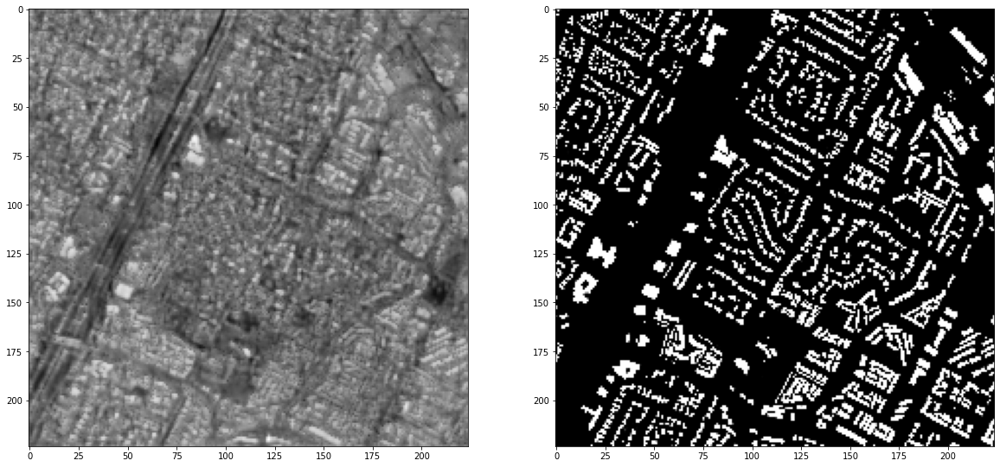

In [42]:
model.eval()
for inputs in aerial_validation_loader:

    #print(dataloaders['train'])
    inputs['image'] = inputs['image'].to(device)
    #print(inputs['image'].shape)
    inputs['mask'] =  inputs['mask'].to(device)
    

    outputs,_,_ = model(inputs['image'])




    outputs_numpy = outputs.cpu().detach().numpy()[1,:,:,:]
    mask_numpy =   inputs['mask'].cpu().detach().numpy()[1,:,:,:]

    print(outputs_numpy.reshape(224,224,1).shape)
    print(mask_numpy.reshape(224,224,1).shape)
    plt.figure(figsize = (20,10))

    plt.subplot(121)
    plt.imshow(outputs_numpy.reshape(224,224),cmap='gray')
    plt.subplot(122)
    plt.imshow(mask_numpy.reshape(224,224),cmap='gray')

    print(ok)


##**Feature-Extraction and Display of Feature Maps of Intermediate Layers for an example image tensor (After Model-training)**

In [54]:
model_feat = UNet(n_channels=3, n_classes=1)


In [50]:
model_feat.load_state_dict(model.state_dict())

<All keys matched successfully>

torch.FloatTensor
DoubleConv(
  (double_conv): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
)


<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

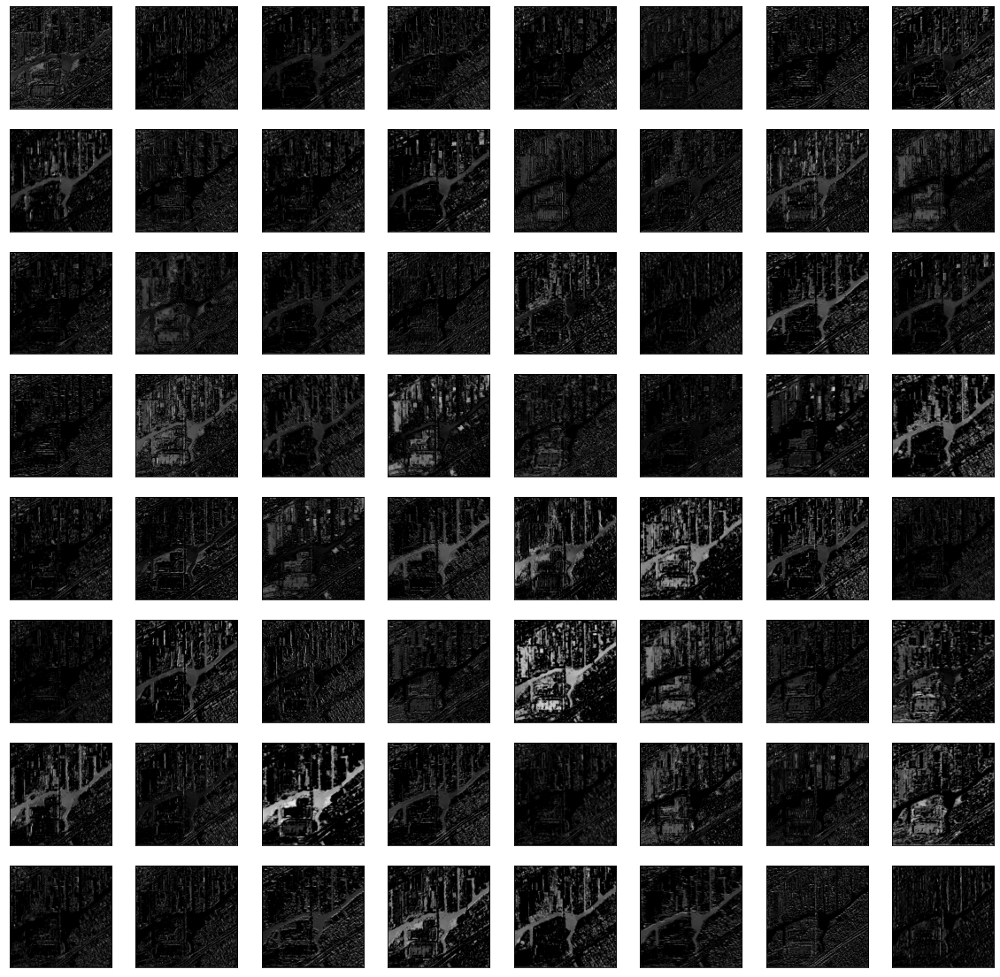

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

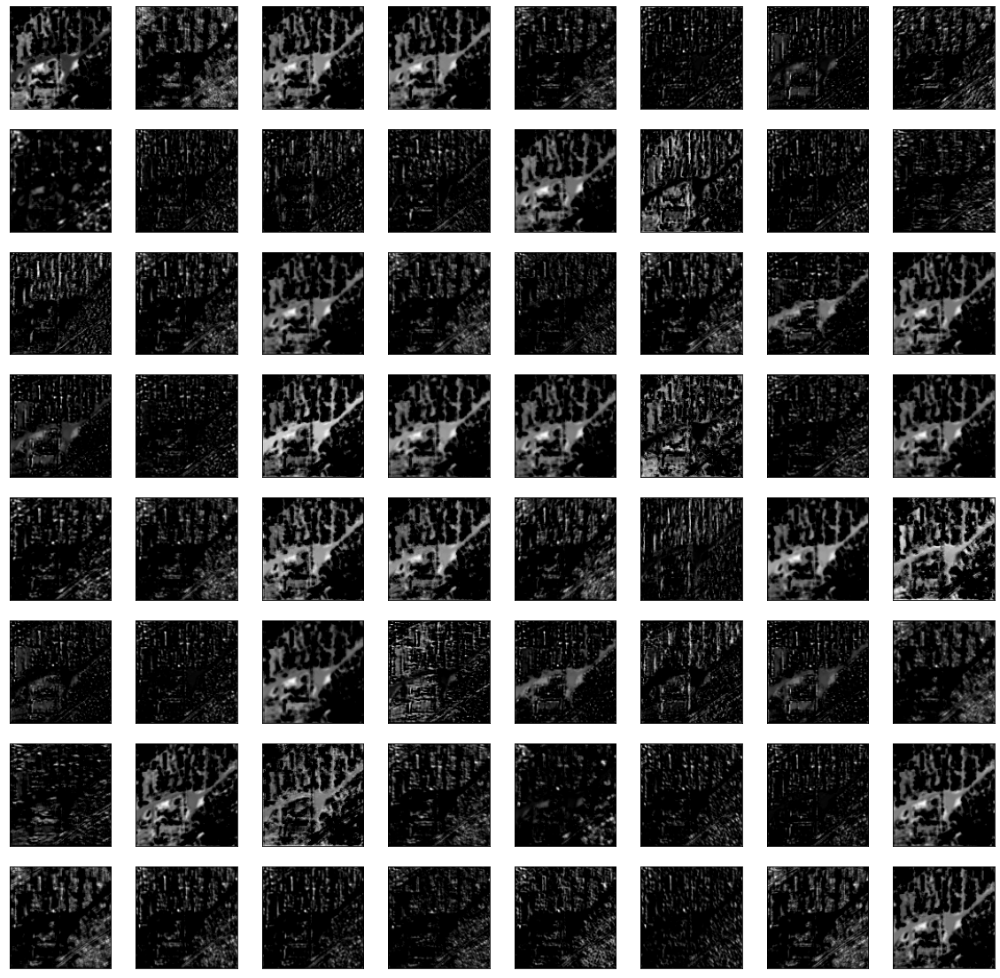

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

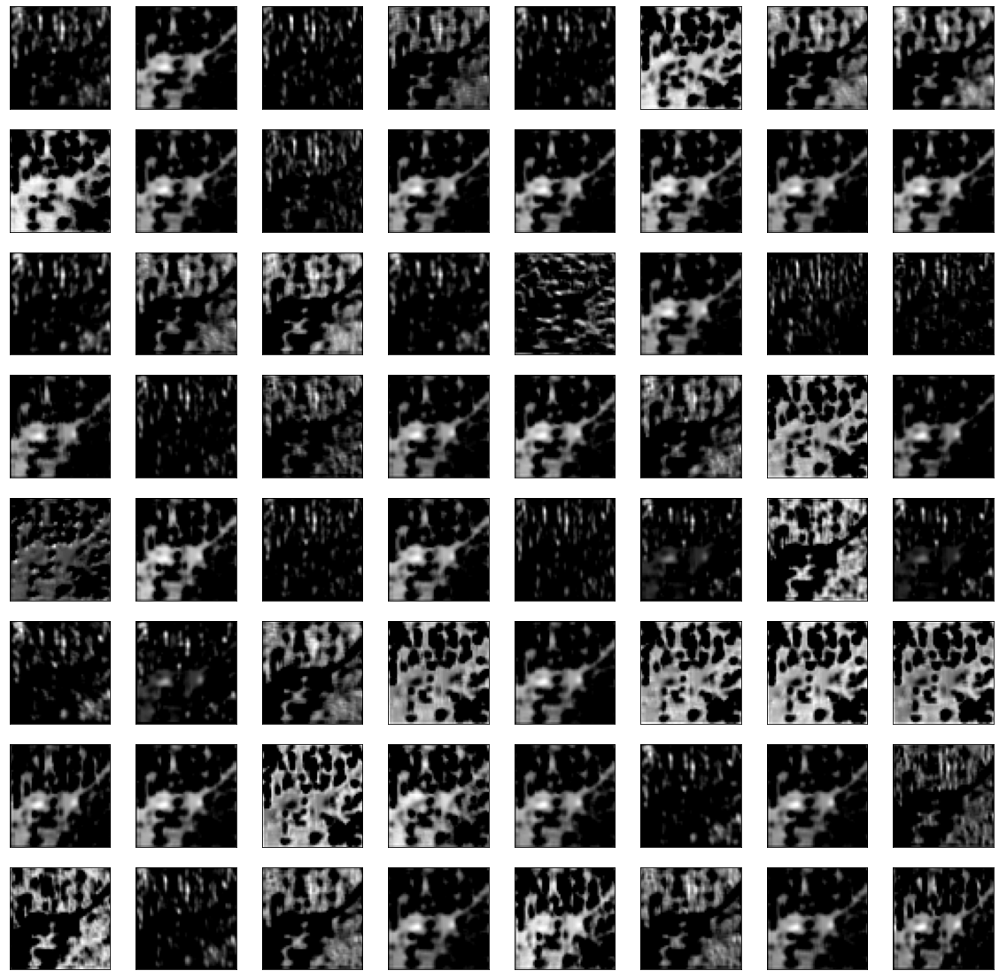

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

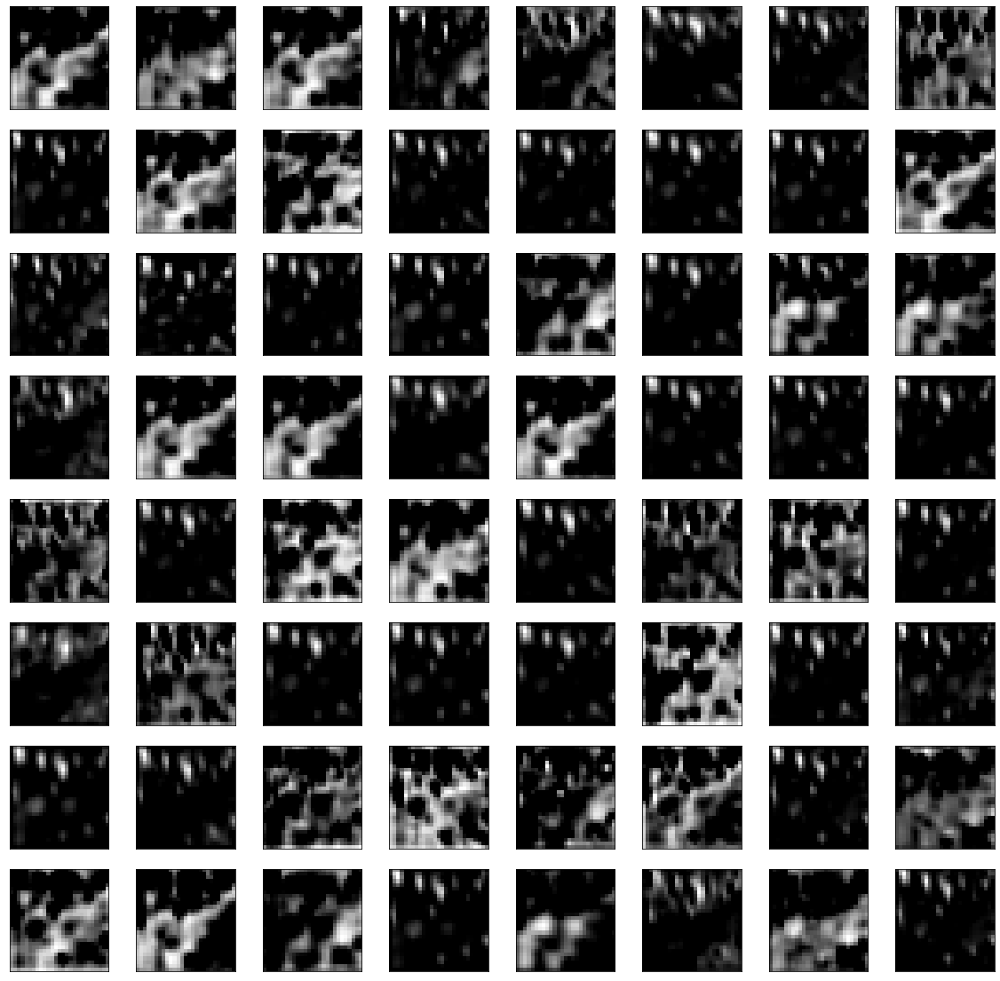

Down(
  (maxpool_conv): Sequential(
    (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (1): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
  )
)


<Figure size 1440x720 with 0 Axes>

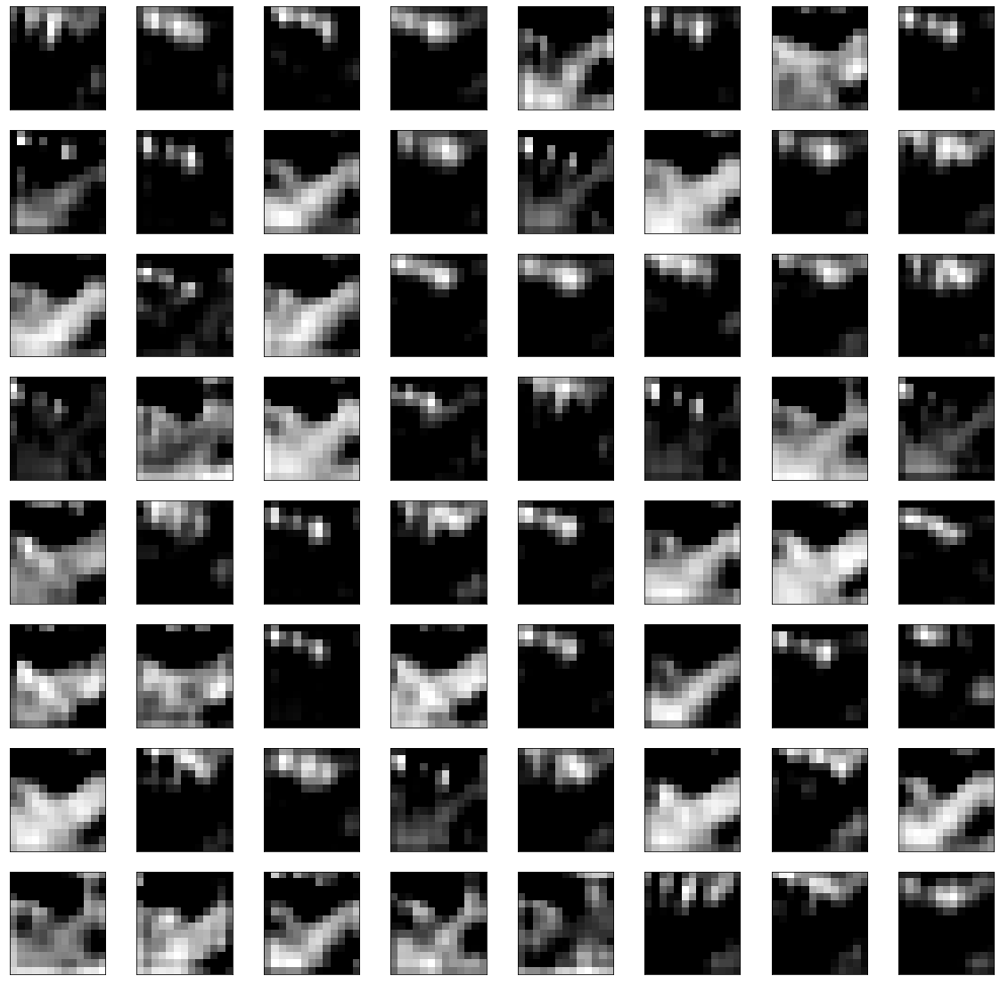

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

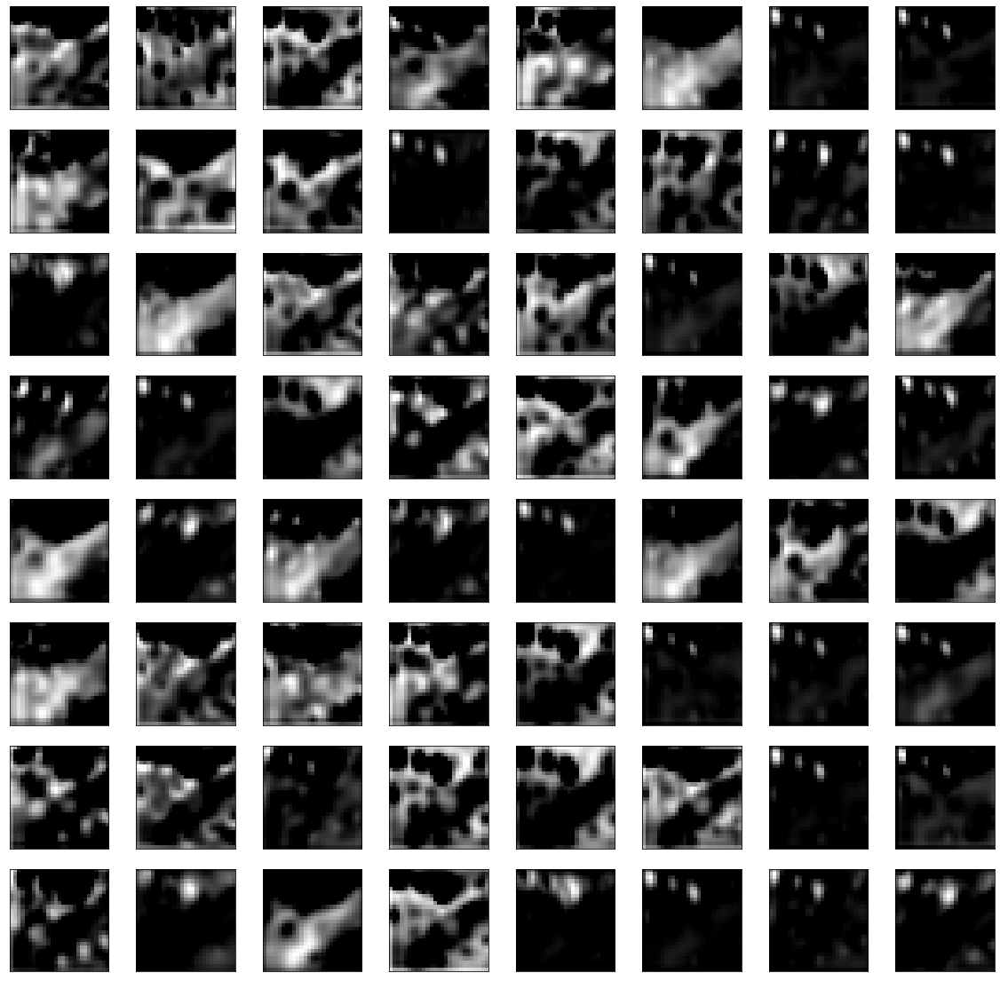

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

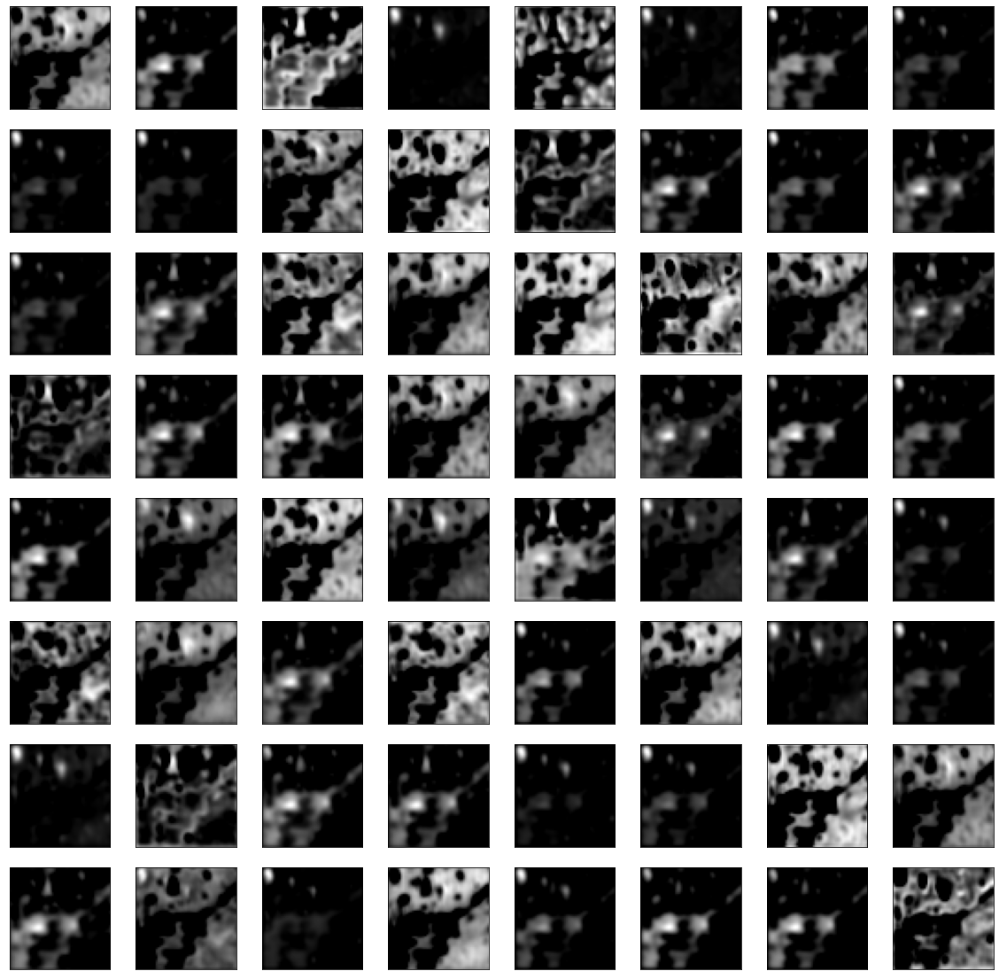

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

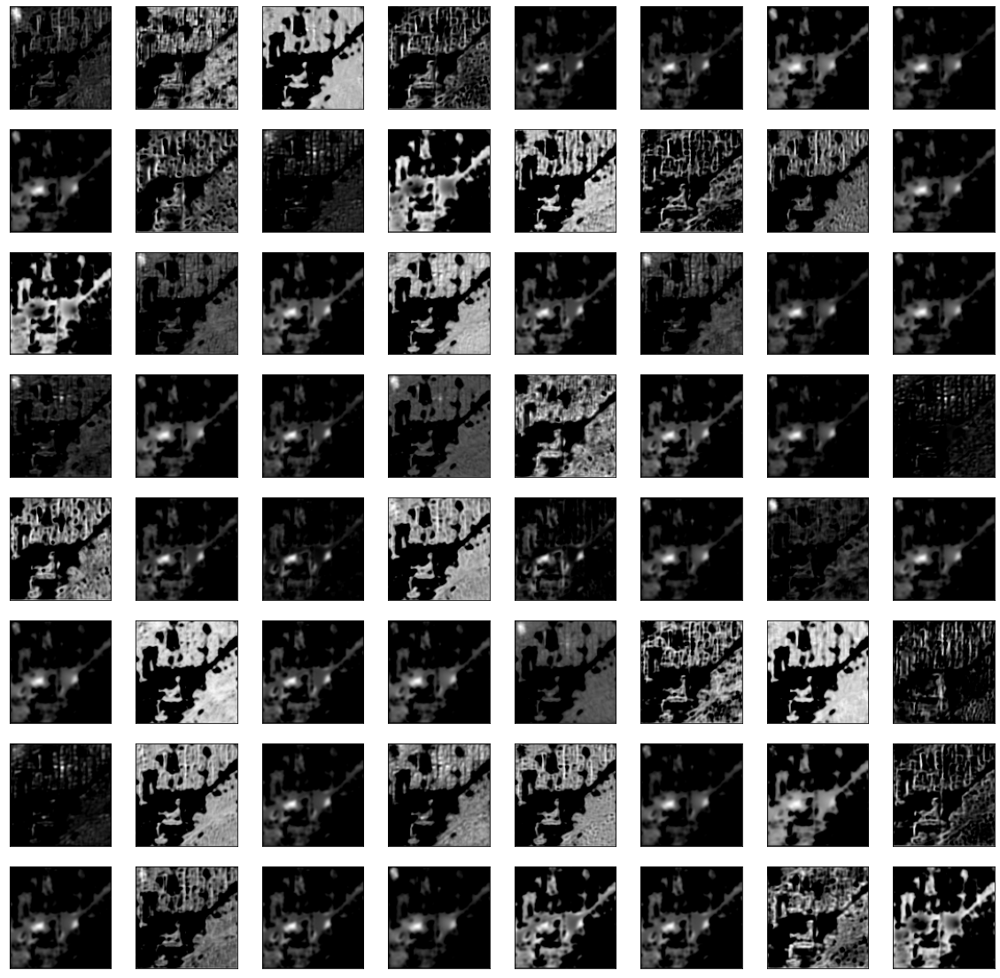

Up(
  (up): Upsample(scale_factor=2.0, mode=bilinear)
  (conv): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
)


<Figure size 1440x720 with 0 Axes>

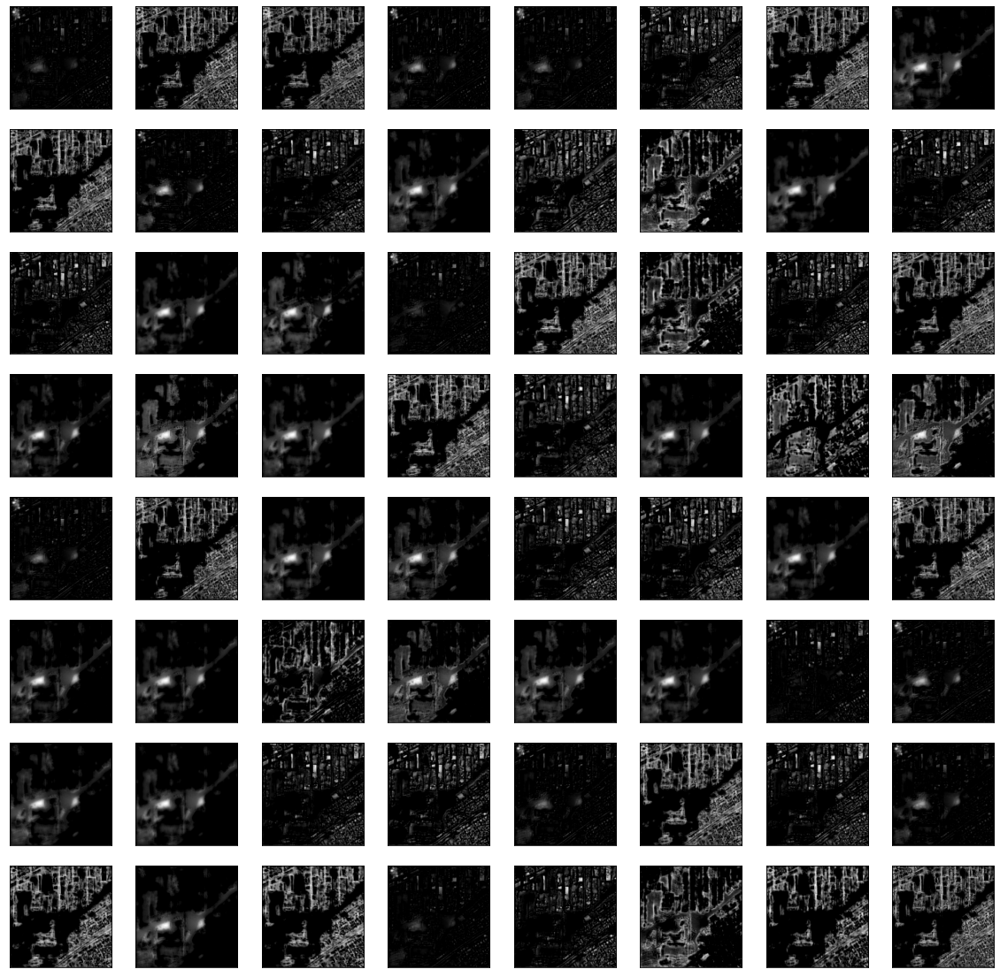

OutConv(
  (conv): Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))
)
(1, 224, 224)


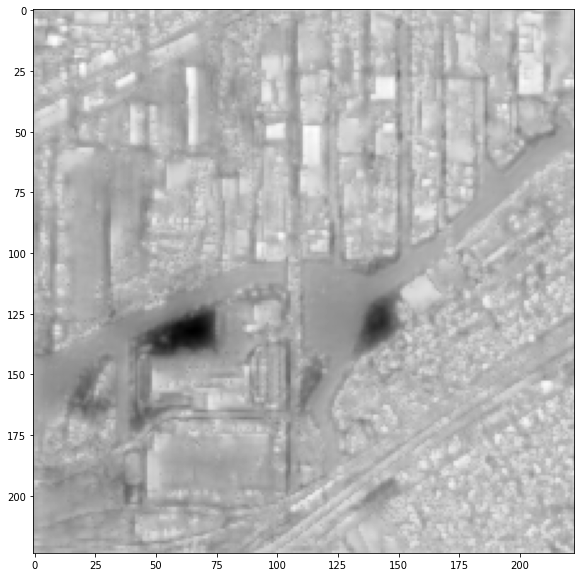

Feature Extraction done for first image (without any training)


In [46]:
plt.figure(figsize = (20,10))


for i, sample in enumerate(aerial_validation_loader):
  img_var = Variable(sample['image'][1,:,:,:].unsqueeze(0))
  print(img_var.type())

  out,img_feat_all,layers = model_feat(img_var)


  for j,img_feat_batch in enumerate(img_feat_all):

    img_feat_1 = img_feat_batch[0,:,:,:]
    plt.figure(figsize = (20,10))


    img_numpy = img_feat_1.cpu().data.numpy()

    print(layers[j])
    
    if j>=9:
      print(img_numpy.shape)
      
      plt.imshow(img_numpy[0, :, :-1], cmap='gray')
      plt.show()
      print('Feature Extraction done for first image (without any training)')
    
      break

    # plot all 64 maps in an 8x8 squares
    square = 8
    square1 = int(8)
    ind = 1
    plt.figure(figsize = (20,20))
    for _ in range(square1):
      for _ in range(square):
        # specify subplot and turn of axis
        ax = plt.subplot(square1, square, ind)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        plt.imshow(img_numpy[ind-1, :, :-1], cmap='gray')
        ind += 1
    # show the figure


    plt.show()
  break



##**Obeservation**



*   This is of-course not a great model, the point was to show how image-features developed over-the course of training.
*   The Model can be improved by either maybe using a pretrained-decoder like Resnet/VGG and/or a better loss function (tried dice,iou,bce,jaccard, combo of the previous ones ), which can decrease and learn faster & better and/or augmentation. As you can notice, the BCE loss-function is decreasing, which is great, but not at a large-amount.

